Mosquito:
0 , 1 , 2 , 3 , 4 , 5 , 6 , 7 , 8 , 9 , 10 , 11 , 12 , 13 , 14 , 15 , 16 , 17 , 18 , 19 , 20 , 21 , 22 , 23 , 24 , 25 , 26 , 27 , 28 , 29 , 30 , 31 , 32 , 33 , 34 , 35 , 36 , 37 , 38 , 39 , 40 , 41 , 42 , 43 , 44 , 45 , 46 , 47 , 48 , 49 , 50 , 51 , 52 , 53 , 54 , 55 , 56 , 57 , 58 , 59 , 60 , 61 , 62 , 63 , 64 , 65 , 66 , 67 , 68 , 69 , 70 , 71 , 72 , 73 , 74 , 75 , 76 , 77 , 78 , 79 , 80 , 81 , 82 , 83 , 84 , 85 , 86 , 87 , 88 , 89 , 90 , 91 , 92 , 93 , 94 , 95 , 96 , 97 , 98 , 99 , 100 , 101 , 102 , 103 , 104 , 105 , 106 , 107 , 108 , 109 , 110 , 111 , 112 , 113 , 114 , 115 , 116 , 117 , 118 , 119 , 120 , 121 , 122 , 123 , 124 , 125 , 126 , 127 , 128 , 129 , 130 , 131 , 132 , 133 , 134 , 135 , 136 , 137 , 138 , 139 , 140 , 141 , 142 , 143 , 144 , 145 , 146 , 147 , 148 , 149 , 150 , 151 , 152 , 153 , 154 , 155 , 156 , 157 , 158 , 159 , 160 , 161 , 162 , 163 , 164 , 165 , 166 , 167 , 168 , 169 , 170 , 171 , 172 , 173 , 174 , 175 , 176 , 177 , 178 , 179 , 180 , 181 , 182 , 18

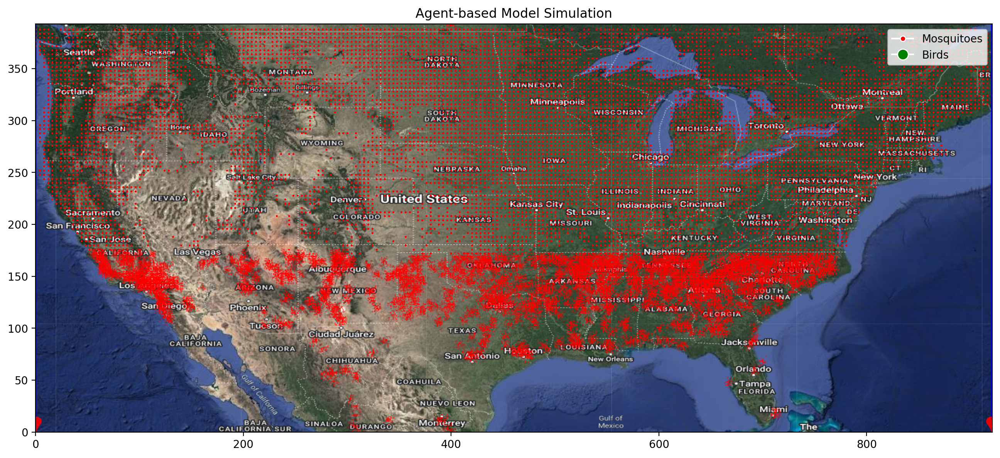

step =  2
step =  3


KeyboardInterrupt: 

In [1]:
import numpy as np
import pandas as pd
from mesa import Agent, Model
from mesa.time import RandomActivation
from mesa.space import MultiGrid
import random
import csv
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import math
import matplotlib.image as mpimg

# Define the WNVParameters class
class WNVParameters:
    def __init__(self, temperature=0, precipitation=0):
        self.temperature = temperature
        self.precipitation = precipitation
        self.transovarial_rate = 0.7  # Probability of vertical transmission in mosquitoes
        self.mosquito_life_span = 15  # Average lifespan of mosquitoes in days
        self.bird_life_span = 365  # Average lifespan of birds in days
        self.initial_mosquito_count = 469024
        self.initial_bird_count = 0
        self.initial_infectious_fraction = 0.1
        self.recovery_rate = 0.05  # Probability of recovery for infected birds
        # self.grid_width = 2371
        # self.grid_height = 1071
        self.grid_width = 921
        self.grid_height = 393
        self.simulation_steps = 30  # Run for one month
        self.mosquito_group_size = 100

    def mosquito_birth_rate(self, T, P):
        return 0.05 * math.exp(-0.1 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def bird_birth_rate(self, T):
        return 0.01 * math.exp(-0.05 * (T - 20)**2)

    def mosquito_death_rate(self, T):
        return 0.03 * math.exp(0.02 * abs(T - 25))

    def bird_death_rate(self, T):
        return 0.01 * math.exp(0.02 * abs(T - 20))

    def infection_probability(self, T):
        return 0.1 * math.exp(-0.1 * (T - 25)**2)

    def egg_to_larvae_rate(self, T, P):
        return 0.2 * math.exp(-0.05 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def larvae_to_pupae_rate(self, T, P):
        return 0.3 * math.exp(-0.04 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def pupae_to_adult_rate(self, T, P):
        return 0.4 * math.exp(-0.03 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

# Define GISDataHandler class
class GISDataHandler:
    def __init__(self, width, height, days, mock=True):
        if mock:
            self.bird_data = self.generate_mock_bird_data(width, height, days)
            self.mosquito_data = self.generate_mock_mosquito_data(width, height, days)
            self.temperature_data = self.generate_mock_temperature_data(width, height, days)
            self.precipitation_data = self.generate_mock_precipitation_data(width, height, days)
        else:
            self.bird_data = self.load_data(bird_data_path)
            self.mosquito_data = self.load_data(mosquito_data_path)
            self.temperature_data = self.load_data(temp_data_path)
            self.precipitation_data = self.load_data(precip_data_path)

    def load_data(self, data_path):
        data = pd.read_csv(data_path, header=None)
        days = [data.iloc[day].values.reshape(-1, int(np.sqrt(data.shape[1]))) for day in range(365)]
        return np.array(days)

    def generate_mock_bird_data(self, width, height, days):
        return np.random.randint(1, 100, (days, width, height))  # Random bird abundance values

    def generate_mock_mosquito_data(self, width, height, days):
        return np.random.randint(1, 100, (days, width, height))  # Random mosquito abundance values

    def generate_mock_temperature_data(self, width, height, days):
        base_temperature = np.random.normal(25, 5, (width, height))  # Base temperature around 25°C with some variation
        daily_variation = np.random.normal(0, 2, (days, width, height))  # Daily variation around 0°C with 2°C standard deviation
        return np.clip(base_temperature + daily_variation, 10, 40)  # Ensure temperatures are between 10°C and 40°C

    def generate_mock_precipitation_data(self, width, height, days):
        base_precipitation = np.random.normal(50, 20, (width, height))  # Base precipitation around 50mm with some variation
        daily_variation = np.random.normal(0, 5, (days, width, height))  # Daily variation around 0mm with 5mm standard deviation
        return np.clip(base_precipitation + daily_variation, 0, 100)  # Ensure precipitation is between 0mm and 100mm

    def get_abundance(self, x, y, day, agent_type):
        if agent_type == "bird":
            return self.bird_data[day, x, y]
        elif agent_type == "mosquito":
            return self.mosquito_data[day, x, y]
        else:
            raise ValueError("Invalid agent type. Use 'bird' or 'mosquito'.")

    def get_environmental_data(self, x, y, day):
        temperature = self.temperature_data[day, x, y]
        precipitation = self.precipitation_data[day, x, y]
        return temperature, precipitation

# Define Mosquito agent
class Mosquito(Agent):
    def __init__(self, unique_id, model, state="egg", parent_state=None):
        super().__init__(unique_id, model)
        self.state = state
        self.parent_state = parent_state

    def step(self):
        day = self.model.schedule.steps % 30
        x, y = self.pos
        T, P = self.model.gis_data.get_environmental_data(x, y, day)

        if self.state == "egg":
            if random.random() < self.model.parameters.egg_to_larvae_rate(T, P):
                self.state = "larvae"
        elif self.state == "larvae":
            if random.random() < self.model.parameters.larvae_to_pupae_rate(T, P):
                self.state = "pupae"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "pupae":
            if random.random() < self.model.parameters.pupae_to_adult_rate(T, P):
                self.state = "susceptible"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "susceptible":
            self.move()
            if random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
            elif self.model.check_infection(self):
                self.state = "exposed"
            self.give_birth(T, P)
        elif self.state == "exposed":
            if random.random() < self.model.parameters.infection_probability(T):
                self.state = "infectious"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "infectious":
            self.move()
            if random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
            self.give_birth(T, P)

    def move(self):
        possible_steps = self.model.grid.get_neighborhood(self.pos, moore=True, include_center=False, radius=self.random.randint(1, 5))
        new_position = random.choice(possible_steps)
        self.model.grid.move_agent(self, new_position)

    def give_birth(self, T, P):
        if random.random() < self.model.parameters.mosquito_birth_rate(T, P):
            x, y = self.pos
            new_mosquito = Mosquito(self.model.next_id(), self.model, state="egg", parent_state=self.state)
            self.model.schedule.add(new_mosquito)
            self.model.grid.place_agent(new_mosquito, (x, y))

# Define Bird agent
class Bird(Agent):
    def __init__(self, unique_id, model, state="susceptible"):
        super().__init__(unique_id, model)
        self.state = state

    def step(self):
        day = self.model.schedule.steps % 30
        x, y = self.pos
        T, P = self.model.gis_data.get_environmental_data(x, y, day)
        
        if self.state == "susceptible":
            self.move()
            if self.model.check_infection(self):
                self.state = "exposed"
            self.give_birth(T)
        elif self.state == "exposed":
            if random.random() < self.model.parameters.infection_probability(T):
                self.state = "infectious"
            elif random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"
        elif self.state == "infectious":
            self.move()
            if random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"
            elif random.random() < self.model.parameters.recovery_rate:
                self.state = "recovered"
            self.give_birth(T)
        elif self.state == "recovered":
            if random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"

    def move(self):
        possible_steps = self.model.grid.get_neighborhood(self.pos, moore=True, include_center=False, radius=self.random.randint(5, 25))
        new_position = random.choice(possible_steps)
        self.model.grid.move_agent(self, new_position)

    def give_birth(self, T):
        if random.random() < self.model.parameters.bird_birth_rate(T):
            x, y = self.pos
            new_bird = Bird(self.model.next_id(), self.model, state="susceptible")
            self.model.schedule.add(new_bird)
            self.model.grid.place_agent(new_bird, (x, y))

# Define WNVModel
class WNVModel(Model):
    def __init__(self, parameters, mock=True):
        super().__init__()
        self.parameters = parameters
        self.grid = MultiGrid(self.parameters.grid_width, self.parameters.grid_height, True)
        self.schedule = RandomActivation(self)
        self.gis_data = GISDataHandler(self.parameters.grid_width, self.parameters.grid_height, 30, mock=mock)
        self.initialize_agents()
        self.infectious_counts = {'mosquitoes': [], 'birds': []}
        self.alive_counts = {'mosquitoes': [], 'birds': []}

        self.results_file = open('simulation_results.csv', 'w', newline='')
        self.csv_writer = csv.writer(self.results_file)
        self.csv_writer.writerow(['step', 'agent_id', 'agent_type', 'x', 'y', 'state'])

    def initialize_agents(self):
        initial_infectious_mosquitoes = int(self.parameters.initial_mosquito_count * self.parameters.initial_infectious_fraction)
        
        # Load the mosquito distribution data (assuming you pass it when creating the model)
        # culex_distribution = pd.read_csv('culex_distribution.csv', header=None)  # Replace with the correct loading method if needed
        culex_distribution = pd.read_parquet('culex_distribution.parquet')
        
        mosquito_id = 0  # Starting ID for mosquitoes
        
        # Iterate through the DataFrame and initialize agents
        print('Mosquito:')
        for x in range(culex_distribution.shape[0]):  # Rows
            print(x, ',', end=' ')
            for y in range(culex_distribution.shape[1]):  # Columns
                # print(x, ' ', y)
                num_groups = culex_distribution.iloc[x, y]  # Number of mosquito groups in this cell
                for _ in range(int(num_groups)):  # Each group represents 100 mosquitoes
                    # for _ in range(100):
                    state = "infectious" if mosquito_id < initial_infectious_mosquitoes else "egg"
                    mosquito = Mosquito(mosquito_id, self, state)
                    self.schedule.add(mosquito)
                    self.grid.place_agent(mosquito, (y, x))
                    mosquito_id += 1

        # Initialize birds (not using the distribution data)
        initial_infectious_birds = int(self.parameters.initial_bird_count * self.parameters.initial_infectious_fraction)
        print('')
        print('Birds:')
        for i in range(self.parameters.initial_bird_count):
            print(i, ',', end=' ')
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            state = "infectious" if i < initial_infectious_birds else "susceptible"
            agent = Bird(self.parameters.initial_mosquito_count + i, self, state)
            self.schedule.add(agent)
            self.grid.place_agent(agent, (x, y))

    def step(self):
        self.schedule.step()
        self.save_results()
        self.collect_data()

    def save_results(self):
        for agent in self.schedule.agents:
            self.csv_writer.writerow([self.schedule.steps, agent.unique_id, type(agent).__name__, agent.pos[0], agent.pos[1], agent.state])

    def collect_data(self):
        mosquito_infectious_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Mosquito) and agent.state == "infectious")
        bird_infectious_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Bird) and agent.state == "infectious")
        mosquito_alive_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Mosquito) and agent.state != "dead")
        bird_alive_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Bird) and agent.state != "dead")

        self.infectious_counts['mosquitoes'].append(mosquito_infectious_count)
        self.infectious_counts['birds'].append(bird_infectious_count)
        self.alive_counts['mosquitoes'].append(mosquito_alive_count)
        self.alive_counts['birds'].append(bird_alive_count)

    def __del__(self):
        self.results_file.close()

    def check_infection(self, agent):
        x, y = agent.pos
        day = self.schedule.steps % 30
        T, P = self.gis_data.get_environmental_data(x, y, day)
        neighbors = self.grid.get_neighbors(agent.pos, moore=True, include_center=False)

        if isinstance(agent, Mosquito):
            for neighbor in neighbors:
                if isinstance(neighbor, Bird) and neighbor.state == "infectious":
                    return random.random() < self.parameters.infection_probability(T)
        elif isinstance(agent, Bird):
            for neighbor in neighbors:
                if isinstance(neighbor, Mosquito) and neighbor.state == "infectious":
                    return random.random() < self.parameters.infection_probability(T)
        return False

# Visualization function
def animate_simulation(model, num_steps, filename_combined, filename_mosquitoes, filename_birds, map_image_path):
    fig_combined, ax_combined = plt.subplots(figsize=(16, 9), dpi=200)

    ims_combined = []
    # Load the map image
    img = mpimg.imread(map_image_path)
    # Display the map image as the background for combined plot
    ax_combined.imshow(img, extent=[0, model.grid.width, 0, model.grid.height])

    num = 1
    print('')
    for step in range(num_steps):
        model.step()
        print('step = ', num)
        num = num + 1
        agents = model.schedule.agents

        # Combined animation
        if num == 10:
            x_mosquitoes_combined = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state != "dead"]
            y_mosquitoes_combined = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state != "dead"]
            x_birds_combined = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state != "dead"]
            y_birds_combined = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state != "dead"]
    
            im_mosquitoes_combined = ax_combined.scatter(x_mosquitoes_combined, y_mosquitoes_combined, c='r', alpha=0.6, s=0.1, label='Mosquitoes' if step == 0 else "")
            im_birds_combined = ax_combined.scatter(x_birds_combined, y_birds_combined, c='g', alpha=0.6, s=2, label='Birds' if step == 0 else "")
            ims_combined.append([im_mosquitoes_combined, im_birds_combined])
    
    
            handles_combined, labels_combined = ax_combined.get_legend_handles_labels()
            mosquito_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=5, label='Mosquitoes')
            by_label_combined = dict(zip(labels_combined, handles_combined))
            bird_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, label='Birds')
            ax_combined.legend(handles=[mosquito_legend, bird_legend], loc="upper right")
            ax_combined.set_title('Agent-based Model Simulation')
            plt.show()


# Plot infectious counts
def plot_infectious_counts(model):
    steps = range(len(model.infectious_counts['mosquitoes']))
    plt.figure()
    plt.plot(steps, model.infectious_counts['mosquitoes'], label='Infectious Mosquitoes')
    plt.plot(steps, model.infectious_counts['birds'], label='Infectious Birds')
    plt.plot(steps, model.alive_counts['mosquitoes'], label='Alive Mosquitoes', linestyle='--')
    plt.plot(steps, model.alive_counts['birds'], label='Alive Birds', linestyle='--')
    plt.xlabel('Step')
    plt.ylabel('Number of Agents')
    plt.title('Agent Counts Over Time')
    plt.legend()
    plt.grid(True)
    plt.savefig('agent_counts.png')
    plt.show()


# Running the model
if __name__ == "__main__":
    parameters = WNVParameters()
    model = WNVModel(parameters, mock=True)
    animate_simulation(model, num_steps=parameters.simulation_steps, filename_combined='wnv_combined_simulation.mp4', filename_mosquitoes='wnv_mosquitoes_simulation.mp4', filename_birds='wnv_birds_simulation.mp4', map_image_path='MapV2.png')
    plot_infectious_counts(model)


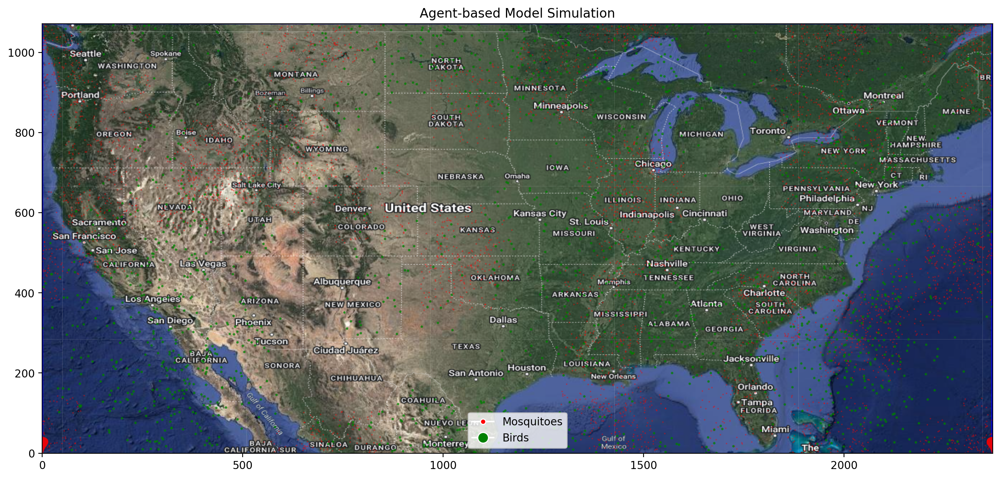

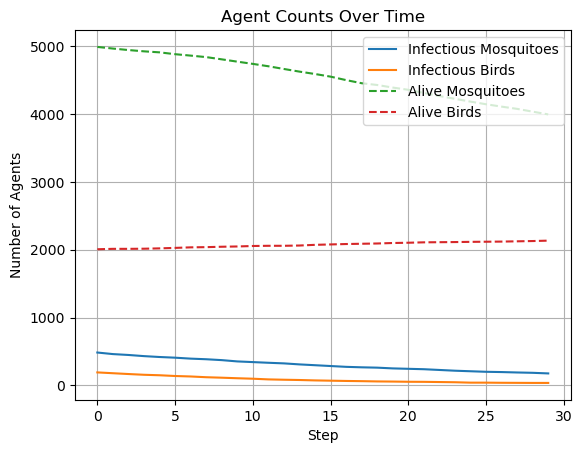

In [16]:
import numpy as np
import pandas as pd
from mesa import Agent, Model
from mesa.time import RandomActivation
from mesa.space import MultiGrid
import random
import csv
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import math
import matplotlib.image as mpimg

# Define the WNVParameters class
class WNVParameters:
    def __init__(self, temperature=0, precipitation=0):
        self.temperature = temperature
        self.precipitation = precipitation
        self.transovarial_rate = 0.7  # Probability of vertical transmission in mosquitoes
        self.mosquito_life_span = 15  # Average lifespan of mosquitoes in days
        self.bird_life_span = 365  # Average lifespan of birds in days
        self.initial_mosquito_count = 5000
        self.initial_bird_count = 2000
        self.initial_infectious_fraction = 0.1
        self.recovery_rate = 0.05  # Probability of recovery for infected birds
        self.grid_width = 2371
        self.grid_height = 1071
        self.simulation_steps = 30  # Run for one month
        self.mosquito_group_size = 100

    def mosquito_birth_rate(self, T, P):
        return 0.05 * math.exp(-0.1 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def bird_birth_rate(self, T):
        return 0.01 * math.exp(-0.05 * (T - 20)**2)

    def mosquito_death_rate(self, T):
        return 0.03 * math.exp(0.02 * abs(T - 25))

    def bird_death_rate(self, T):
        return 0.01 * math.exp(0.02 * abs(T - 20))

    def infection_probability(self, T):
        return 0.1 * math.exp(-0.1 * (T - 25)**2)

    def egg_to_larvae_rate(self, T, P):
        return 0.2 * math.exp(-0.05 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def larvae_to_pupae_rate(self, T, P):
        return 0.3 * math.exp(-0.04 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

    def pupae_to_adult_rate(self, T, P):
        return 0.4 * math.exp(-0.03 * (T - 25)**2) * math.exp(-0.01 * (P - 50)**2)

# Define GISDataHandler class
class GISDataHandler:
    def __init__(self, width, height, days, mock=True):
        if mock:
            self.bird_data = self.generate_mock_bird_data(width, height, days)
            self.mosquito_data = self.generate_mock_mosquito_data(width, height, days)
            self.temperature_data = self.generate_mock_temperature_data(width, height, days)
            self.precipitation_data = self.generate_mock_precipitation_data(width, height, days)
        else:
            self.bird_data = self.load_data(bird_data_path)
            self.mosquito_data = self.load_data(mosquito_data_path)
            self.temperature_data = self.load_data(temp_data_path)
            self.precipitation_data = self.load_data(precip_data_path)

    def load_data(self, data_path):
        data = pd.read_csv(data_path, header=None)
        days = [data.iloc[day].values.reshape(-1, int(np.sqrt(data.shape[1]))) for day in range(365)]
        return np.array(days)

    def generate_mock_bird_data(self, width, height, days):
        return np.random.randint(1, 100, (days, width, height))  # Random bird abundance values

    def generate_mock_mosquito_data(self, width, height, days):
        return np.random.randint(1, 100, (days, width, height))  # Random mosquito abundance values

    def generate_mock_temperature_data(self, width, height, days):
        base_temperature = np.random.normal(25, 5, (width, height))  # Base temperature around 25°C with some variation
        daily_variation = np.random.normal(0, 2, (days, width, height))  # Daily variation around 0°C with 2°C standard deviation
        return np.clip(base_temperature + daily_variation, 10, 40)  # Ensure temperatures are between 10°C and 40°C

    def generate_mock_precipitation_data(self, width, height, days):
        base_precipitation = np.random.normal(50, 20, (width, height))  # Base precipitation around 50mm with some variation
        daily_variation = np.random.normal(0, 5, (days, width, height))  # Daily variation around 0mm with 5mm standard deviation
        return np.clip(base_precipitation + daily_variation, 0, 100)  # Ensure precipitation is between 0mm and 100mm

    def get_abundance(self, x, y, day, agent_type):
        if agent_type == "bird":
            return self.bird_data[day, x, y]
        elif agent_type == "mosquito":
            return self.mosquito_data[day, x, y]
        else:
            raise ValueError("Invalid agent type. Use 'bird' or 'mosquito'.")

    def get_environmental_data(self, x, y, day):
        temperature = self.temperature_data[day, x, y]
        precipitation = self.precipitation_data[day, x, y]
        return temperature, precipitation

# Define Mosquito agent
class Mosquito(Agent):
    def __init__(self, unique_id, model, state="egg", parent_state=None):
        super().__init__(unique_id, model)
        self.state = state
        self.parent_state = parent_state

    def step(self):
        day = self.model.schedule.steps % 30
        x, y = self.pos
        T, P = self.model.gis_data.get_environmental_data(x, y, day)

        if self.state == "egg":
            if random.random() < self.model.parameters.egg_to_larvae_rate(T, P):
                self.state = "larvae"
        elif self.state == "larvae":
            if random.random() < self.model.parameters.larvae_to_pupae_rate(T, P):
                self.state = "pupae"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "pupae":
            if random.random() < self.model.parameters.pupae_to_adult_rate(T, P):
                self.state = "susceptible"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "susceptible":
            self.move()
            if random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
            elif self.model.check_infection(self):
                self.state = "exposed"
            self.give_birth(T, P)
        elif self.state == "exposed":
            if random.random() < self.model.parameters.infection_probability(T):
                self.state = "infectious"
            elif random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
        elif self.state == "infectious":
            self.move()
            if random.random() < self.model.parameters.mosquito_death_rate(T):
                self.state = "dead"
            self.give_birth(T, P)

    def move(self):
        possible_steps = self.model.grid.get_neighborhood(self.pos, moore=True, include_center=False, radius=self.random.randint(1, 5))
        new_position = random.choice(possible_steps)
        self.model.grid.move_agent(self, new_position)

    def give_birth(self, T, P):
        if random.random() < self.model.parameters.mosquito_birth_rate(T, P):
            x, y = self.pos
            new_mosquito = Mosquito(self.model.next_id(), self.model, state="egg", parent_state=self.state)
            self.model.schedule.add(new_mosquito)
            self.model.grid.place_agent(new_mosquito, (x, y))

# Define Bird agent
class Bird(Agent):
    def __init__(self, unique_id, model, state="susceptible"):
        super().__init__(unique_id, model)
        self.state = state

    def step(self):
        day = self.model.schedule.steps % 30
        x, y = self.pos
        T, P = self.model.gis_data.get_environmental_data(x, y, day)
        
        if self.state == "susceptible":
            self.move()
            if self.model.check_infection(self):
                self.state = "exposed"
            self.give_birth(T)
        elif self.state == "exposed":
            if random.random() < self.model.parameters.infection_probability(T):
                self.state = "infectious"
            elif random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"
        elif self.state == "infectious":
            self.move()
            if random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"
            elif random.random() < self.model.parameters.recovery_rate:
                self.state = "recovered"
            self.give_birth(T)
        elif self.state == "recovered":
            if random.random() < self.model.parameters.bird_death_rate(T):
                self.state = "dead"

    def move(self):
        possible_steps = self.model.grid.get_neighborhood(self.pos, moore=True, include_center=False, radius=self.random.randint(5, 25))
        new_position = random.choice(possible_steps)
        self.model.grid.move_agent(self, new_position)

    def give_birth(self, T):
        if random.random() < self.model.parameters.bird_birth_rate(T):
            x, y = self.pos
            new_bird = Bird(self.model.next_id(), self.model, state="susceptible")
            self.model.schedule.add(new_bird)
            self.model.grid.place_agent(new_bird, (x, y))

# Define WNVModel
class WNVModel(Model):
    def __init__(self, parameters, mock=True):
        super().__init__()
        self.parameters = parameters
        self.grid = MultiGrid(self.parameters.grid_width, self.parameters.grid_height, True)
        self.schedule = RandomActivation(self)
        self.gis_data = GISDataHandler(self.parameters.grid_width, self.parameters.grid_height, 30, mock=mock)

        self.initialize_agents()

        self.infectious_counts = {'mosquitoes': [], 'birds': []}
        self.alive_counts = {'mosquitoes': [], 'birds': []}

        self.results_file = open('simulation_results.csv', 'w', newline='')
        self.csv_writer = csv.writer(self.results_file)
        self.csv_writer.writerow(['step', 'agent_id', 'agent_type', 'x', 'y', 'state'])

    def initialize_agents(self):
        initial_infectious_mosquitoes = int(self.parameters.initial_mosquito_count * self.parameters.initial_infectious_fraction)
        initial_infectious_birds = int(self.parameters.initial_bird_count * self.parameters.initial_infectious_fraction)

        # Function to create clusters of agents
        def create_cluster(agent_class, count, initial_infectious, infectious_state, non_infectious_state):
            cluster_centers = [(self.random.randrange(self.grid.width), self.random.randrange(self.grid.height)) for _ in range(40)]  # Adjust number of clusters
            for i in range(count):
                if i < initial_infectious:
                    state = infectious_state
                else:
                    state = non_infectious_state
                cluster_center_x, cluster_center_y = random.choice(cluster_centers)
                if agent_class == Bird:
                    offset_x = self.random.randint(-150, 150)  # Adjust cluster spread
                    offset_y = self.random.randint(-150, 150)
                elif agent_class == Mosquito:
                    offset_x = self.random.randint(-100, 100)  # Adjust cluster spread
                    offset_y = self.random.randint(-100, 100)
                x = (cluster_center_x + offset_x) % self.grid.width
                y = (cluster_center_y + offset_y) % self.grid.height
                agent = agent_class(self.next_id(), self, state)
                self.schedule.add(agent)
                self.grid.place_agent(agent, (x, y))

        create_cluster(Mosquito, self.parameters.initial_mosquito_count, initial_infectious_mosquitoes, "infectious", "egg")
        create_cluster(Bird, self.parameters.initial_bird_count, initial_infectious_birds, "infectious", "susceptible")

    def step(self):
        self.schedule.step()
        self.save_results()
        self.collect_data()

    def save_results(self):
        for agent in self.schedule.agents:
            self.csv_writer.writerow([self.schedule.steps, agent.unique_id, type(agent).__name__, agent.pos[0], agent.pos[1], agent.state])

    def collect_data(self):
        mosquito_infectious_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Mosquito) and agent.state == "infectious")
        bird_infectious_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Bird) and agent.state == "infectious")
        mosquito_alive_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Mosquito) and agent.state != "dead")
        bird_alive_count = sum(1 for agent in self.schedule.agents if isinstance(agent, Bird) and agent.state != "dead")

        self.infectious_counts['mosquitoes'].append(mosquito_infectious_count)
        self.infectious_counts['birds'].append(bird_infectious_count)
        self.alive_counts['mosquitoes'].append(mosquito_alive_count)
        self.alive_counts['birds'].append(bird_alive_count)

    def __del__(self):
        self.results_file.close()

    def check_infection(self, agent):
        x, y = agent.pos
        day = self.schedule.steps % 30
        T, P = self.gis_data.get_environmental_data(x, y, day)
        neighbors = self.grid.get_neighbors(agent.pos, moore=True, include_center=False)

        if isinstance(agent, Mosquito):
            for neighbor in neighbors:
                if isinstance(neighbor, Bird) and neighbor.state == "infectious":
                    return random.random() < self.parameters.infection_probability(T)
        elif isinstance(agent, Bird):
            for neighbor in neighbors:
                if isinstance(neighbor, Mosquito) and neighbor.state == "infectious":
                    return random.random() < self.parameters.infection_probability(T)
        return False

# Visualization function
def animate_simulation(model, num_steps, filename_combined, filename_mosquitoes, filename_birds, map_image_path):
    fig_combined, ax_combined = plt.subplots(figsize=(16, 9), dpi=200)
    # fig_mosquitoes, ax_mosquitoes = plt.subplots(figsize=(16, 9), dpi=200)
    # fig_birds, ax_birds = plt.subplots(figsize=(16, 9), dpi=200)
    ims_combined = []
    ims_mosquitoes = []
    ims_birds = []

    # Load the map image
    img = mpimg.imread(map_image_path)

    # Display the map image as the background for combined plot
    ax_combined.imshow(img, extent=[0, model.grid.width, 0, model.grid.height])
    # ax_mosquitoes.imshow(img, extent=[0, model.grid.width, 0, model.grid.height])
    # ax_birds.imshow(img, extent=[0, model.grid.width, 0, model.grid.height])

    for step in range(num_steps):
        model.step()
        agents = model.schedule.agents

        # Combined animation
        x_mosquitoes_combined = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state != "dead"]
        y_mosquitoes_combined = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state != "dead"]
        x_birds_combined = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state != "dead"]
        y_birds_combined = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state != "dead"]

        im_mosquitoes_combined = ax_combined.scatter(x_mosquitoes_combined, y_mosquitoes_combined, c='r', alpha=0.6, s=0.1, label='Mosquitoes' if step == 0 else "")
        im_birds_combined = ax_combined.scatter(x_birds_combined, y_birds_combined, c='g', alpha=0.6, s=2, label='Birds' if step == 0 else "")
        ims_combined.append([im_mosquitoes_combined, im_birds_combined])

        handles_combined, labels_combined = ax_combined.get_legend_handles_labels()
        mosquito_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=5, label='Mosquitoes')
        by_label_combined = dict(zip(labels_combined, handles_combined))
        bird_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, label='Birds')
        ax_combined.legend(handles=[mosquito_legend, bird_legend])
        ax_combined.set_title('Agent-based Model Simulation')
        plt.pause(0.1)

        # # Mosquitoes animation with lifecycle states
        # x_mosquitoes_larvae = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state == "larvae"]
        # y_mosquitoes_larvae = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state == "larvae"]
        # x_mosquitoes_pupae = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state == "pupae"]
        # y_mosquitoes_pupae = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state == "pupae"]
        # x_mosquitoes_susceptible = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state == "susceptible"]
        # y_mosquitoes_susceptible = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state == "susceptible"]
        # x_mosquitoes_infectious = [agent.pos[0] for agent in agents if isinstance(agent, Mosquito) and agent.state == "infectious"]
        # y_mosquitoes_infectious = [agent.pos[1] for agent in agents if isinstance(agent, Mosquito) and agent.state == "infectious"]

        # im_mosquitoes_larvae = ax_mosquitoes.scatter(x_mosquitoes_larvae, y_mosquitoes_larvae, c='blue', alpha=0.6, s=10, label='Larvae' if step == 0 else "")
        # im_mosquitoes_pupae = ax_mosquitoes.scatter(x_mosquitoes_pupae, y_mosquitoes_pupae, c='purple', alpha=0.6, s=10, label='Pupae' if step == 0 else "")
        # im_mosquitoes_susceptible = ax_mosquitoes.scatter(x_mosquitoes_susceptible, y_mosquitoes_susceptible, c='green', alpha=0.6, s=10, label='Susceptible' if step == 0 else "")
        # im_mosquitoes_infectious = ax_mosquitoes.scatter(x_mosquitoes_infectious, y_mosquitoes_infectious, c='red', alpha=0.6, s=10, label='Infectious' if step == 0 else "")
        # ims_mosquitoes.append([im_mosquitoes_larvae, im_mosquitoes_pupae, im_mosquitoes_susceptible, im_mosquitoes_infectious])

        # # Birds animation with lifecycle states
        # x_birds_susceptible = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state == "susceptible"]
        # y_birds_susceptible = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state == "susceptible"]
        # x_birds_exposed = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state == "exposed"]
        # y_birds_exposed = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state == "exposed"]
        # x_birds_infectious = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state == "infectious"]
        # y_birds_infectious = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state == "infectious"]
        # x_birds_recovered = [agent.pos[0] for agent in agents if isinstance(agent, Bird) and agent.state == "recovered"]
        # y_birds_recovered = [agent.pos[1] for agent in agents if isinstance(agent, Bird) and agent.state == "recovered"]

        # im_birds_susceptible = ax_birds.scatter(x_birds_susceptible, y_birds_susceptible, c='green', alpha=0.6, s=10, label='Susceptible' if step == 0 else "")
        # im_birds_exposed = ax_birds.scatter(x_birds_exposed, y_birds_exposed, c='orange', alpha=0.6, s=10, label='Exposed' if step == 0 else "")
        # im_birds_infectious = ax_birds.scatter(x_birds_infectious, y_birds_infectious, c='red', alpha=0.6, s=10, label='Infectious' if step == 0 else "")
        # im_birds_recovered = ax_birds.scatter(x_birds_recovered, y_birds_recovered, c='blue', alpha=0.6, s=10, label='Recovered' if step == 0 else "")
        # ims_birds.append([im_birds_susceptible, im_birds_exposed, im_birds_infectious, im_birds_recovered])

    # ani_combined = animation.ArtistAnimation(fig_combined, ims_combined, interval=200, blit=True, repeat_delay=1000)
    # ani_mosquitoes = animation.ArtistAnimation(fig_mosquitoes, ims_mosquitoes, interval=200, blit=True, repeat_delay=1000)
    # ani_birds = animation.ArtistAnimation(fig_birds, ims_birds, interval=200, blit=True, repeat_delay=1000)

    # handles_combined, labels_combined = ax_combined.get_legend_handles_labels()
    # mosquito_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=10, label='Mosquitoes')
    # by_label_combined = dict(zip(labels_combined, handles_combined))
    # bird_legend = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, label='Birds')
    # ax_combined.legend(handles=[mosquito_legend, bird_legend])
    # ax_combined.set_title('Agent-based Model Simulation')

    # mosquito_legend_larvae = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Larvae')
    # handles_mosquitoes, labels_mosquitoes = ax_mosquitoes.get_legend_handles_labels()
    # mosquito_legend_pupae = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='Pupae')
    # by_label_mosquitoes = dict(zip(labels_mosquitoes, handles_mosquitoes))
    # mosquito_legend_susceptible = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Susceptible')
    # ax_mosquitoes.legend(by_label_mosquitoes.values(), by_label_mosquitoes.keys())
    # mosquito_legend_infectious = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Infectious')
    # ax_mosquitoes.legend(handles=[mosquito_legend_larvae, mosquito_legend_pupae, mosquito_legend_susceptible, mosquito_legend_infectious])
    # ax_mosquitoes.set_title('Mosquito Lifecycle States')

    # bird_legend_susceptible = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Susceptible')
    # handles_birds, labels_birds = ax_birds.get_legend_handles_labels()
    # bird_legend_exposed = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Exposed')
    # by_label_birds = dict(zip(labels_birds, handles_birds))
    # bird_legend_infectious = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Infectious')
    # ax_birds.legend(by_label_birds.values(), by_label_birds.keys())
    # bird_legend_recovered = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Recovered')
    # ax_birds.legend(handles=[bird_legend_susceptible, bird_legend_exposed, bird_legend_infectious, bird_legend_recovered])
    # ax_birds.set_title('Bird Lifecycle States')

    # ani_combined.save(filename_combined, writer='ffmpeg')
    # ani_mosquitoes.save(filename_mosquitoes, writer='ffmpeg')
    # ani_birds.save(filename_birds, writer='ffmpeg')

    plt.show()

# Plot infectious counts
def plot_infectious_counts(model):
    steps = range(len(model.infectious_counts['mosquitoes']))
    plt.figure()
    plt.plot(steps, model.infectious_counts['mosquitoes'], label='Infectious Mosquitoes')
    plt.plot(steps, model.infectious_counts['birds'], label='Infectious Birds')
    plt.plot(steps, model.alive_counts['mosquitoes'], label='Alive Mosquitoes', linestyle='--')
    plt.plot(steps, model.alive_counts['birds'], label='Alive Birds', linestyle='--')
    plt.xlabel('Step')
    plt.ylabel('Number of Agents')
    plt.title('Agent Counts Over Time')
    plt.legend()
    plt.grid(True)
    plt.savefig('agent_counts.png')
    plt.show()

# Running the model
if __name__ == "__main__":
    parameters = WNVParameters()
    model = WNVModel(parameters, mock=True)
    animate_simulation(model, num_steps=parameters.simulation_steps, filename_combined='wnv_combined_simulation.mp4', filename_mosquitoes='wnv_mosquitoes_simulation.mp4', filename_birds='wnv_birds_simulation.mp4', map_image_path='MapV2.png')
    plot_infectious_counts(model)
